# KNN project 

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

%matplotlib inline 
sns.set()

In [2]:
from sklearn.neighbors import KNeighborsClassifier

In [3]:
df = pd.read_csv("KNN_Project_Data")

In [4]:
df.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC,TARGET CLASS
0,1636.670614,817.988525,2565.995189,358.347163,550.417491,1618.870897,2147.641254,330.727893,1494.878631,845.136088,0
1,1013.402760,577.587332,2644.141273,280.428203,1161.873391,2084.107872,853.404981,447.157619,1193.032521,861.081809,1
2,1300.035501,820.518697,2025.854469,525.562292,922.206261,2552.355407,818.676686,845.491492,1968.367513,1647.186291,1
3,1059.347542,1066.866418,612.000041,480.827789,419.467495,685.666983,852.867810,341.664784,1154.391368,1450.935357,0
4,1018.340526,1313.679056,950.622661,724.742174,843.065903,1370.554164,905.469453,658.118202,539.459350,1899.850792,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   XVPM          1000 non-null   float64
 1   GWYH          1000 non-null   float64
 2   TRAT          1000 non-null   float64
 3   TLLZ          1000 non-null   float64
 4   IGGA          1000 non-null   float64
 5   HYKR          1000 non-null   float64
 6   EDFS          1000 non-null   float64
 7   GUUB          1000 non-null   float64
 8   MGJM          1000 non-null   float64
 9   JHZC          1000 non-null   float64
 10  TARGET CLASS  1000 non-null   int64  
dtypes: float64(10), int64(1)
memory usage: 86.1 KB


Since the data is "artificial" hence don't know the actual columns, rather than EDA, just create pairplot to visualize the relationships (with hue = 'TARGET CLASS')

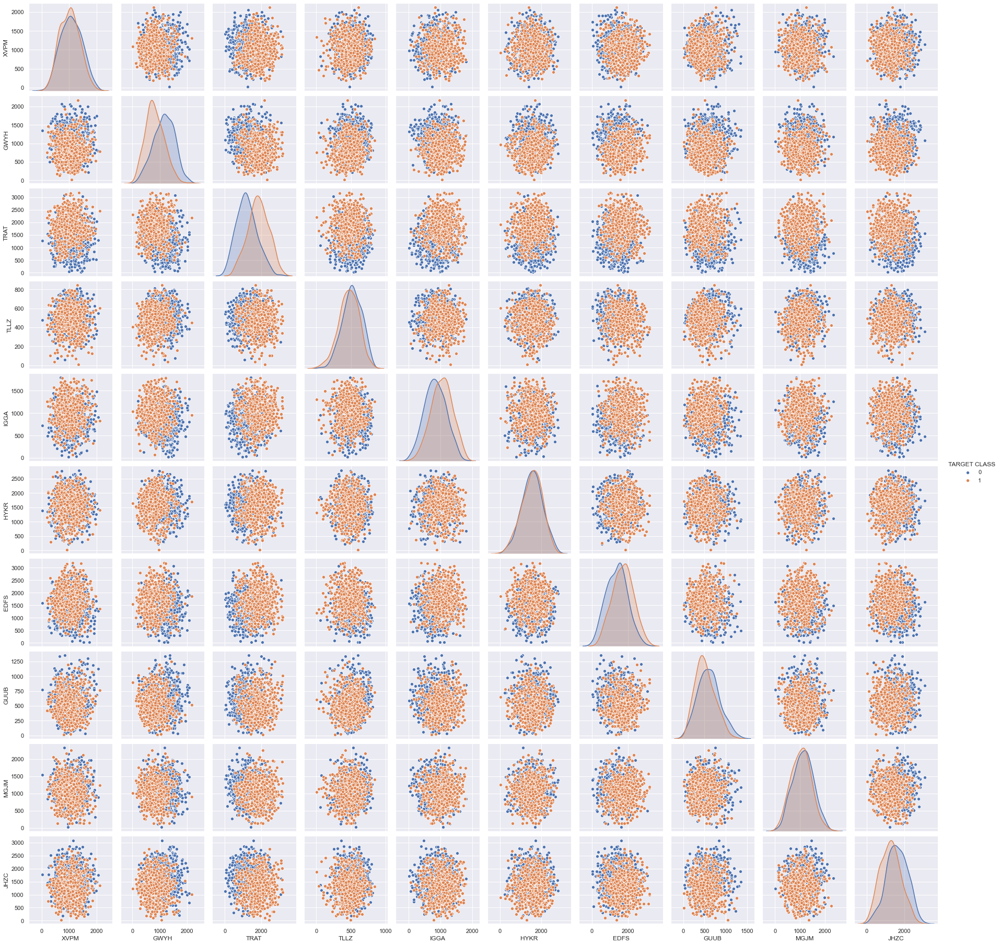

In [6]:
sns.pairplot(df, hue='TARGET CLASS')

In [7]:
from sklearn.preprocessing import StandardScaler

In [8]:
scaler = StandardScaler()

In [9]:
scaler.fit(df.iloc[:,:-1])

StandardScaler()

In [10]:
scaler_feat = scaler.transform(df.iloc[:,:-1])

In [11]:
df_feat = pd.DataFrame(scaler_feat, columns = df.columns[:-1])

In [12]:
df_feat.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC
0,1.568522,-0.443435,1.619808,-0.958255,-1.128481,0.138336,0.980493,-0.932794,1.008313,-1.069627
1,-0.112376,-1.056574,1.741918,-1.504220,0.640009,1.081552,-1.182663,-0.461864,0.258321,-1.041546
2,0.660647,-0.436981,0.775793,0.213394,-0.053171,2.030872,-1.240707,1.149298,2.184784,0.342811
3,0.011533,0.191324,-1.433473,-0.100053,-1.507223,-1.753632,-1.183561,-0.888557,0.162310,-0.002793
4,-0.099059,0.820815,-0.904346,1.609015,-0.282065,-0.365099,-1.095644,0.391419,-1.365603,0.787762


In [13]:
from sklearn.model_selection import train_test_split

In [14]:
#start with KNN=1
knn = KNeighborsClassifier(n_neighbors=1)

In [15]:
X_train,X_test,y_train,y_test =train_test_split(df_feat, df.iloc[:,-1], test_size=0.2, random_state=42)

In [16]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [17]:
k_predict = knn.predict(X_test)

In [18]:
from sklearn.metrics import confusion_matrix, classification_report

In [19]:
pd.DataFrame(confusion_matrix(y_test, k_predict), columns=['Predict 0', 'Predict 1'],
index = ['Actual 0', 'Actual 1'])

,Predict 0,Predict 1
Actual 0,76,24
Actual 1,25,75


In [20]:
print()
print(classification_report(y_test, k_predict))


              precision    recall  f1-score   support

           0       0.75      0.76      0.76       100
           1       0.76      0.75      0.75       100

    accuracy                           0.76       200
   macro avg       0.76      0.76      0.75       200
weighted avg       0.76      0.76      0.75       200



In [21]:
error_rate=[]
for i in range(1,41):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    k_pred = knn.predict(X_test)
    error_rate.append(np.mean(k_pred != y_test))

Text(0.5, 0, 'KNN value')

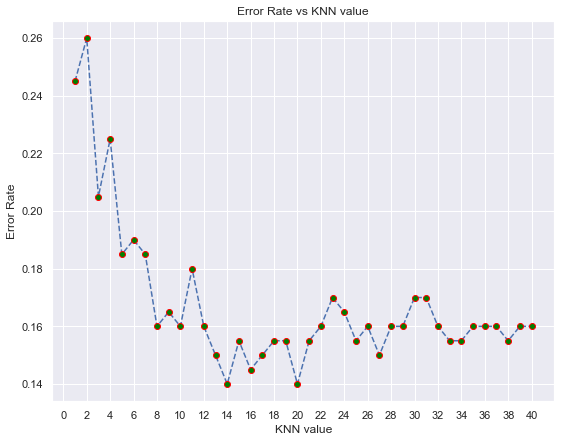

In [22]:
plt.figure(figsize=(9,7))
plt.plot(range(1,41), error_rate, marker='o', markerfacecolor='green', markeredgecolor='red', ls='--')
plt.title('Error Rate vs KNN value')
plt.ylabel('Error Rate')
plt.xticks(range(0,42,2))
plt.xlabel('KNN value')

In [23]:
#KNN = 33 

knn = KNeighborsClassifier(n_neighbors=33)
knn.fit(X_train,y_train)
k_pred33 = knn.predict(X_test)

In [24]:
pd.DataFrame(confusion_matrix(y_test, k_pred33), columns=['Predict False', 'Predict True'],
index=['Actual False', 'Actual True'])

,Predict False,Predict True
Actual False,88,12
Actual True,19,81


In [25]:
print()
print(classification_report(y_test, k_pred33))


              precision    recall  f1-score   support

           0       0.82      0.88      0.85       100
           1       0.87      0.81      0.84       100

    accuracy                           0.84       200
   macro avg       0.85      0.84      0.84       200
weighted avg       0.85      0.84      0.84       200

